In [1]:
import os
import shutil
import zarr
import dask.array as da
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from mpl_toolkits.mplot3d import Axes3D

In [33]:
zarr_paths = [
    '/data/HCR_772643-3b-1_2025-03-05_10-00-00/SPIM.ome.zarr',
    '/data/HCR_772643-3b-1_2025-03-19_10-00-00/SPIM.ome.zarr',
    '/data/HCR_772643-3b-1_2025-03-26_10-00-00/SPIM.ome.zarr',
    #'/data/HCR_772643-3a-3_2025-03-19_10-00-00/SPIM.ome.zarr'
]

if not zarr_paths:
    raise ValueError("zarr_paths list is empty.")

# get cell_id from first path
path = zarr_paths[0]
parts = path.split('HCR_')[1]
cell_id = parts.split('_')[0]

# make sure the cell_id is consistent across all paths
for path in zarr_paths:
    if path.split('HCR_')[1].split('_')[0] != cell_id:
        raise ValueError("Inconsistent cell_id found in the dataset paths.")

# print the extracted cell_id
print("Extracted cell_id:", cell_id)

Extracted cell_id: 772643-3b-1


In [34]:
channels_per_round = [
    ['405', '488', '561', '594'],  # round 1; check 594 vs 638 (if syto used)
    ['405', '488', '561', '638'],  # round 2
    ['405', '488', '561', '638'],  # round 3
    #['405', '488', '561', '638']   # round 4
]

genes_per_round = [
    {'405': 'Rn28s', '488': 'GFP', '561': 'Pvalb', '594': 'Syto59'},  # round 1 genes
    {'405': 'Rn28s', '488': 'GFP', '561': 'Ecel1', '638': 'Spp1'},  # round 2 genes
    {'405': 'Rn28s', '488': 'GFP', '561': 'Cplx3', '638': 'Fxdy6'},  # round 3 genes
   # {'405': 'Rn28s', '488': 'GFP', '561': 'Pvalb', '638': 'Tacr3'}   # round 4 genes
]

In [35]:
plots_dir = os.path.join('/results/', 'plots')
if not os.path.exists(plots_dir):
    os.makedirs(plots_dir)
    
channels = ['405', '488', '561', '594', '638']
res_level = '2'

In [36]:
# projection parameters
z_center = 100    # center z-plane
z_margin = 3000     # number of planes above and below the center

# calculate slice boundaries (adjust as needed to avoid negative indices)
z_min = max(0, z_center - z_margin)
z_max = z_center + z_margin + 1  # +1 because slicing in Python is exclusive at the end

#brightness_min = 0      # lower intensity bound for display
#brightness_max = 2000   # upper intensity bound for display

In [16]:
fig, axs = plt.subplots(nrows=len(zarr_paths), ncols=4, figsize=(16, len(zarr_paths)*4))
# ensure 2D array even when only one round can be loaded (one row in zarr_paths)
axs = np.atleast_2d(axs)

plt.subplots_adjust(wspace=0.05, hspace=0.3)

output_plot_path = os.path.join(plots_dir, f'{cell_id}_zproj-{z_center}_margins-{z_margin}_res_{res_level}.png')

for round_idx, zarr_path in enumerate(zarr_paths):
    store = zarr.open(zarr_path, mode='r')
    current_channels = channels_per_round[round_idx]
    
    for ch_idx, ch in enumerate(current_channels):
        channel_key = f"Tile_X_0000_Y_0000_Z_0000_ch_{ch}.zarr" # assume "Tile_X_0000_Y_0000_Z_0000_ch_{channel}.zarr"
        
        try:
            ms_group = store[channel_key]
            level_array = ms_group[res_level]
            dask_img = da.from_array(level_array)
            img_slice = dask_img[0, 0, z_min:z_max, :, :].compute()
            img_proj = da.max(img_slice, axis=0).compute()
            
        except Exception as e:
            print(f"error loading round {round_idx+1} channel {ch}: {e}")
            img_proj = None
        
        ax = axs[round_idx, ch_idx]
        if img_proj is not None:
            #ax.imshow(img_proj, cmap='magma', vmin=brightness_min, vmax=brightness_max)
            vmin, vmax = np.percentile(img_proj, [5, 95])
            ax.imshow(img_proj, cmap='magma', vmin=vmin, vmax=vmax)
        else:
            ax.text(0.5, 0.5, 'Error', ha='center', va='center')
        ax.axis('off')
        
        gene = genes_per_round[round_idx].get(ch, 'N/A')
        ax.set_title(f"Round {round_idx+1}, Ch {ch} ({gene})", fontsize=10)
        
plt.tight_layout()
# plt.show()
plt.savefig(output_plot_path)
plt.close()  
print(f"plot saved f{output_plot_path}")

error loading round 1 channel 594: 'Tile_X_0000_Y_0000_Z_0000_ch_594.zarr'
plot saved f/results/plots/772643-3a-6_zproj-100_margins-3000_res_2.png


Run the code below to plot just the 488 MIP of all rounds

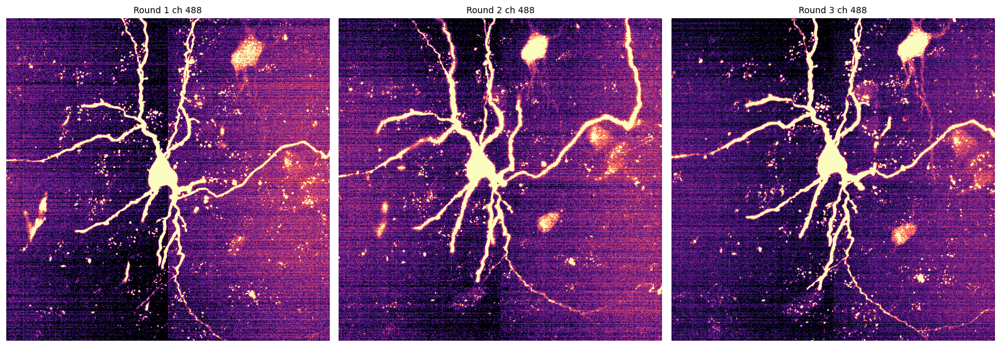

In [37]:
n_rounds = len(zarr_paths)
fig_extra, axs_extra = plt.subplots(nrows=1, ncols=n_rounds, figsize=(16, len(zarr_paths)*4))
axs_extra = np.atleast_1d(axs_extra)

for round_idx, zarr_path in enumerate(zarr_paths):
    store = zarr.open(zarr_path, mode='r')
    # check for 488
    if '488' in channels_per_round[round_idx]:
        channel_key = f"Tile_X_0000_Y_0000_Z_0000_ch_488.zarr" # change channel for other wavelengths if desired
        try:
            ms_group = store[channel_key]
            level_array = ms_group[res_level]
            dask_img = da.from_array(level_array)
            img_slice = dask_img[0, 0, z_min:z_max, :, :].compute()
            img_proj = da.max(img_slice, axis=0).compute()
        except Exception as e:
            print(f"Error loading 488 ch for round {round_idx+1}: {e}")
            img_proj = None
    else:
        print(f"Ch 488 not found for round {round_idx+1}")
        img_proj = None

    ax = axs_extra[round_idx]
    if img_proj is not None:
        vmin, vmax = np.percentile(img_proj, [5, 95])
        ax.imshow(img_proj, cmap='magma', vmin=vmin, vmax=vmax)
    else:
        ax.text(0.5, 0.5, 'Error', ha='center', va='center')
    ax.axis('off')
    ax.set_title(f"Round {round_idx+1} ch 488", fontsize=10)
    
%matplotlib inline
fig_extra.tight_layout()
plt.show()

3D view of the 488 channel -- for morpho-matching to Horta volume

In [9]:
# just look at round 1 488 ch
"""
if you want to look at other rounds:
    zarr_path[0] = round 1
    zarr_path[1] = round 2, etc.
"""

store = zarr.open(zarr_paths[0], mode='r')
label_channel = '488' # GFP=488 or tdT=561
channel_key = f"Tile_X_0000_Y_0000_Z_0000_ch_{label_channel}.zarr"

# open at correct multiscale; DO NOT OPEN AT FULL RES
ms_group = store[channel_key]
res_level_3d = '2'
dask_img = da.from_array(ms_group[res_level_3d])

# extract the 3D volume
volume = dask_img[0, 0, ...].compute()
print("Volume shape:", volume.shape)

# set intensity threshold
threshold = 1000
mask = volume > threshold

# get coordinates of the nonzero voxels (those above the threshold)
z_idx, y_idx, x_idx = np.nonzero(mask)
intensities = volume[z_idx, y_idx, x_idx]

# downsample as needed
max_points = 10000

if len(x_idx) > max_points:
    indices = np.linspace(0, len(x_idx)-1, max_points).astype(int)
    x_idx = x_idx[indices]
    y_idx = y_idx[indices]
    z_idx = z_idx[indices]
    intensities = intensities[indices]

Volume shape: (63, 480, 480)


In [10]:
# generate 3d scatter plot
fig = go.Figure(data=[go.Scatter3d(
    x=x_idx,
    y=y_idx,
    z=z_idx,
    mode='markers',
    marker=dict(
        size=2,
        color=intensities,  # set color based on intensity
        colorscale='Magma',
        opacity=0.8,
        colorbar=dict(title='Intensity')
    )
)])

fig.update_layout(
    title=(f"Raw 488 ch, resolution level {res_level_3d}"),
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z'
    )
)

fig.show()